## Practical Work 1

For this practical work, the trainees will develop a Python program that is able to implement the gradient descent in order to achieve the linear regression (Single and Multivariables) of a set of datapoints.

#### Import numpy, matplotlib.pyplot and make it inline

In [87]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

#### Read RegData csv file into numpy array 

In [88]:
data = np.genfromtxt('RegData.csv',delimiter=',')

In [89]:
data

array([[2.9000001 , 4.        ],
       [6.69999981, 7.4000001 ],
       [4.9000001 , 5.        ],
       [7.9000001 , 7.19999981],
       [9.80000019, 7.9000001 ],
       [6.9000001 , 6.0999999 ],
       [6.0999999 , 6.        ],
       [6.19999981, 5.80000019],
       [6.        , 5.19999981],
       [5.0999999 , 4.19999981],
       [4.69999981, 4.        ],
       [4.4000001 , 4.4000001 ],
       [5.80000019, 5.19999981]])

#### Define variables X and y. 
#### Assign first column data to X and second column to y
<b>Note:</b> X is the independent variable (input to LR model) and y is the dependent variable (output)

In [90]:
X = data[:,0]

In [91]:
X

array([2.9000001 , 6.69999981, 4.9000001 , 7.9000001 , 9.80000019,
       6.9000001 , 6.0999999 , 6.19999981, 6.        , 5.0999999 ,
       4.69999981, 4.4000001 , 5.80000019])

In [92]:
X.shape

(13,)

In [93]:
X=X.reshape(-1,1)

In [94]:
X.shape

(13, 1)

In [95]:
X

array([[2.9000001 ],
       [6.69999981],
       [4.9000001 ],
       [7.9000001 ],
       [9.80000019],
       [6.9000001 ],
       [6.0999999 ],
       [6.19999981],
       [6.        ],
       [5.0999999 ],
       [4.69999981],
       [4.4000001 ],
       [5.80000019]])

In [96]:
Y = data[:,1]

In [97]:
Y

array([4.        , 7.4000001 , 5.        , 7.19999981, 7.9000001 ,
       6.0999999 , 6.        , 5.80000019, 5.19999981, 4.19999981,
       4.        , 4.4000001 , 5.19999981])

In [98]:
Y.shape

(13,)

In [99]:
Y= Y.reshape(-1,1)

In [100]:
Y

array([[4.        ],
       [7.4000001 ],
       [5.        ],
       [7.19999981],
       [7.9000001 ],
       [6.0999999 ],
       [6.        ],
       [5.80000019],
       [5.19999981],
       [4.19999981],
       [4.        ],
       [4.4000001 ],
       [5.19999981]])

In [101]:
Y.shape

(13, 1)

#### Explore your data

#### Plot the original data (scatter plot of X,y)

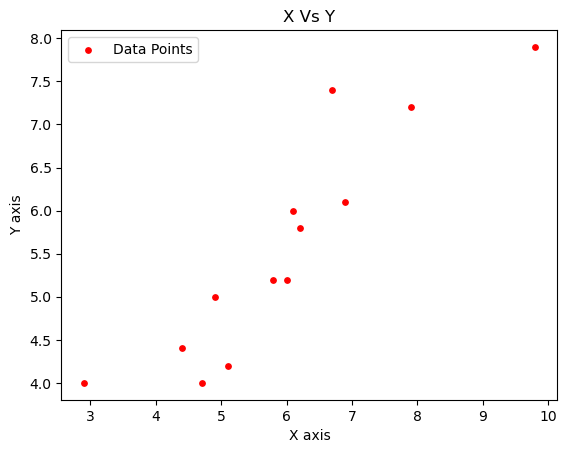

In [102]:
plt.scatter(X,Y,c='red',s=15,marker='o',label='Data Points')
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.title('X Vs Y')
plt.legend() 
plt.show()

## LR Full Implementation

### Step1: Initialize parameters (theta_0 & theta_1) with random value or simply zero. Also choose the Learning rate.

In [135]:
theta_0 = 0
theta_1 = 0
alpha = 0.001


In [136]:
print('Intialization')
print('Intial value for theta_0:', theta_0)
print('Intial value for theta_1:', theta_1)
print('Intial value for learning rate:', alpha)

Intialization
Intial value for theta_0: 0
Intial value for theta_1: 0
Intial value for learning rate: 0.001


### Step2: Use (theta_0 & theta_1) to predict the output h(x)= theta_0 + theta_1 * x.
#### Note: you will need to iterate through all data points

In [105]:
hx = theta_0 + theta_1 * X

In [106]:
print('h(x): \n', hx)

h(x): 
 [[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]


In [107]:
hx.shape

(13, 1)

### Step3: Calculate the MSE Cost function 𝑱(theta_0,theta_1 ).
<b>Note:</b> You better use either dot product or norm square of the error vector.

In [108]:
e = hx - Y

In [109]:
print('Error vector: \n',e)

Error vector: 
 [[-4.        ]
 [-7.4000001 ]
 [-5.        ]
 [-7.19999981]
 [-7.9000001 ]
 [-6.0999999 ]
 [-6.        ]
 [-5.80000019]
 [-5.19999981]
 [-4.19999981]
 [-4.        ]
 [-4.4000001 ]
 [-5.19999981]]


In [110]:
e.shape

(13, 1)

In [111]:
e_norm_2 = np.linalg.norm(e)

In [112]:
j = (e_norm_2 ** 2) / Y.shape[0] 

In [113]:
j

32.61076895938463

In [114]:
e_norm_1 = np.linalg.norm(e, ord=1)

In [115]:
j = (e_norm_1) / Y.shape[0] 

In [116]:
j

5.56923073976923

In [117]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [118]:
mean_squared_error(Y,hx)

32.610768959384636

In [119]:
mean_absolute_error(Y,hx)

5.56923073976923

In [128]:
d_theta_0 = np.sum(e) / Y.shape[0]  
d_theta_1 = np.sum(e * X) / Y.shape[0]

In [130]:
print('d_theta_0:',d_theta_0)
print('d_theta_1:',d_theta_1)

d_theta_0: -5.56923073976923
d_theta_1: -35.043846043215375


### Step5: Update the parameters (simultaneously).

In [137]:
theta_0_new = theta_0 - alpha* d_theta_0
theta_1_new = theta_1 - alpha* d_theta_1

In [138]:
print('theta_0_new :',theta_0_new)
print('theta_1_new :', theta_1_new)

theta_0_new : 0.00556923073976923
theta_1_new : 0.03504384604321537


### Step6: Repeat from 2 to 5 until converge to the minimum or achieve maximum iterations.
#### The objective from this step is to combine all the previous steps and iterate untill you either achieve the maximum number of iterations or reach the minimum.

In [247]:
theta = np.array([[0.0],[0.0]])
alpha = 0.01
max_iterations = 3000
tolerance = 1e-6

for iteration in range(max_iterations):
    print('****************** Iteration ' , iteration , ' ********************')

    # predictions 
    hx = theta[0] + theta[1] * X
    print('h(x): \n', hx)

    # Compute Error
    e = hx - Y
    print('Error Vector: \n',e)

    # Compute Loss function
    e_norm_2 = np.linalg.norm(e)
    j = (e_norm_2 ** 2) / Y.shape[0] 
    print('j = ', j)

    # Compute Gradient Vector
    d_theta_0 = np.sum(e) / Y.shape[0]  
    d_theta_1 = np.sum(e * X) / Y.shape[0]
    gradient = np.array([[d_theta_0], [d_theta_1]])
    print('Gradient Vector \n', gradient)

    # Compute Grdaient Norm
    gradient_norm = np.linalg.norm(gradient)
    print('Gradient Vector Norm: ', gradient_norm)

    # Compute theta_0_new theta_1_new
    theta[0] -= alpha * d_theta_0
    theta[1] -= alpha * d_theta_1

    print('theta_0_new:',theta[0])
    print('theta_1_new:',theta[1])

    if np.linalg.norm(gradient) < tolerance:
        print(f"Converged in {iteration + 1} iterations.")
        break
    
    
print("Final theta_0: ",theta[0])
print("Final theta_1:",theta[1])


****************** Iteration  0  ********************
h(x): 
 [[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
Error Vector: 
 [[-4.        ]
 [-7.4000001 ]
 [-5.        ]
 [-7.19999981]
 [-7.9000001 ]
 [-6.0999999 ]
 [-6.        ]
 [-5.80000019]
 [-5.19999981]
 [-4.19999981]
 [-4.        ]
 [-4.4000001 ]
 [-5.19999981]]
j =  32.61076895938463
Gradient Vector 
 [[ -5.56923074]
 [-35.04384604]]
Gradient Vector Norm:  35.483622652335995
theta_0_new: [0.05569231]
theta_1_new: [0.35043846]
****************** Iteration  1  ********************
h(x): 
 [[1.07196388]
 [2.40362993]
 [1.7728408 ]
 [2.82415618]
 [3.48998929]
 [2.47371772]
 [2.19336688]
 [2.2284107 ]
 [2.15832307]
 [1.84292842]
 [1.702753  ]
 [1.59762157]
 [2.08823544]]
Error Vector: 
 [[-2.92803612]
 [-4.99637017]
 [-3.2271592 ]
 [-4.37584363]
 [-4.41001081]
 [-3.62628219]
 [-3.80663312]
 [-3.5715895 ]
 [-3.04167674]
 [-2.35707139]
 [-2.297247  ]
 [-2.80237853]
 [-3.11176436]]
j =  12.35121761608660

#### Predict y values using the LR equation
##### h(x)= theta_0 + theta_1 * x

In [248]:
hx = theta[0] + theta[1] * X

In [249]:
print('h(x) = y_predict): \n',hx)

h(x) = y_predict): 
 [[3.36021731]
 [6.09505189]
 [4.79960404]
 [6.95868414]
 [8.3261016 ]
 [6.23899077]
 [5.66323594]
 [5.73520521]
 [5.59126667]
 [4.94354258]
 [4.65566516]
 [4.43975736]
 [5.44732814]]


In [250]:
print('Actual Y:\n', Y)

Actual Y:
 [[4.        ]
 [7.4000001 ]
 [5.        ]
 [7.19999981]
 [7.9000001 ]
 [6.0999999 ]
 [6.        ]
 [5.80000019]
 [5.19999981]
 [4.19999981]
 [4.        ]
 [4.4000001 ]
 [5.19999981]]


#### Plot  LR equation output (fitted line) with the original data (scatter plot of X,y)

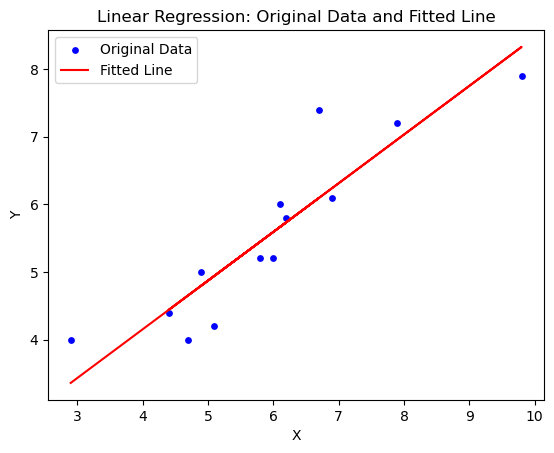

In [251]:
plt.scatter(X, Y, color='blue',s=15, label='Original Data')
plt.plot(X, hx, color='red', label='Fitted Line')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Linear Regression: Original Data and Fitted Line')
plt.legend()
plt.show()

#### Use R2 score to evaluate LR equation output
https://en.wikipedia.org/wiki/Coefficient_of_determination

In [252]:
from sklearn.metrics import r2_score
r2_score(Y,hx)

0.8201590879111575

## Plot loss function
### Repeat your implementaion version and save loss for each iteration (epoch)

In [253]:
theta = np.array([[0.0],[0.0]])
alpha = 0.01
max_iterations = 3000
tolerance = 1e-6
loss = []

for iteration in range(max_iterations):
    print('****************** Iteration ' , iteration , ' ********************')

    # predictions 
    hx = theta[0] + theta[1] * X
    print('h(x): \n', hx)

    # Compute Error
    e = hx - Y
    print('Error Vector: \n',e)

    # Compute Loss function
    e_norm_2 = np.linalg.norm(e)
    j = (e_norm_2 ** 2) / Y.shape[0] 
    print('j = ', j)
    loss.append(j)

    # Compute Gradient Vector
    d_theta_0 = np.sum(e) / Y.shape[0]  
    d_theta_1 = np.sum(e * X) / Y.shape[0]
    gradient = np.array([[d_theta_0], [d_theta_1]])
    print('Gradient Vector \n', gradient)

    # Compute Grdaient Norm
    gradient_norm = np.linalg.norm(gradient)
    print('Gradient Vector Norm: ', gradient_norm)

    # Compute theta_0_new theta_1_new
    theta[0] -= alpha * d_theta_0
    theta[1] -= alpha * d_theta_1

    print('theta_0_new:',theta[0])
    print('theta_1_new:',theta[1])

    if np.linalg.norm(gradient) < tolerance:
        print(f"Converged in {iteration + 1} iterations.")
        break
    

print("Final theta_0: ",theta[0])
print("Final theta_1:",theta[1])

****************** Iteration  0  ********************
h(x): 
 [[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
Error Vector: 
 [[-4.        ]
 [-7.4000001 ]
 [-5.        ]
 [-7.19999981]
 [-7.9000001 ]
 [-6.0999999 ]
 [-6.        ]
 [-5.80000019]
 [-5.19999981]
 [-4.19999981]
 [-4.        ]
 [-4.4000001 ]
 [-5.19999981]]
j =  32.61076895938463
Gradient Vector 
 [[ -5.56923074]
 [-35.04384604]]
Gradient Vector Norm:  35.483622652335995
theta_0_new: [0.05569231]
theta_1_new: [0.35043846]
****************** Iteration  1  ********************
h(x): 
 [[1.07196388]
 [2.40362993]
 [1.7728408 ]
 [2.82415618]
 [3.48998929]
 [2.47371772]
 [2.19336688]
 [2.2284107 ]
 [2.15832307]
 [1.84292842]
 [1.702753  ]
 [1.59762157]
 [2.08823544]]
Error Vector: 
 [[-2.92803612]
 [-4.99637017]
 [-3.2271592 ]
 [-4.37584363]
 [-4.41001081]
 [-3.62628219]
 [-3.80663312]
 [-3.5715895 ]
 [-3.04167674]
 [-2.35707139]
 [-2.297247  ]
 [-2.80237853]
 [-3.11176436]]
j =  12.35121761608660

### Plot loss vs. iterations

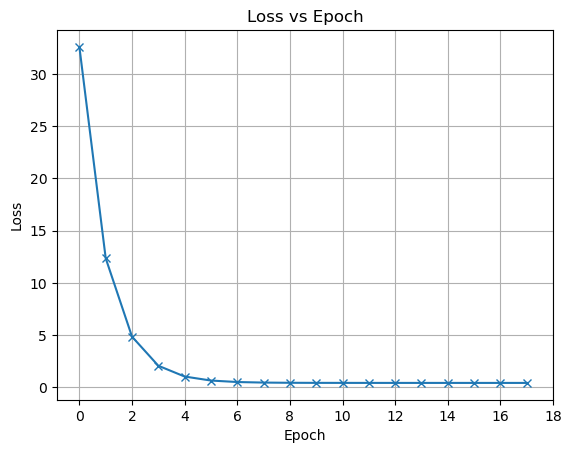

In [254]:
plt.plot(range(18), loss[:18],marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.xticks(range(0, 20, 2))
plt.grid(True)
plt.show()


## Multivariate LR

#### Read MultiVarLR csv file into numpy array.
#### The first three columns are x1,x2, and x3.
#### The last column is the target label y.

In [226]:
data2 = np.genfromtxt('MultiVarLR.csv',delimiter=',')

In [227]:
data2

array([[ 73.,  80.,  75., 152.],
       [ 93.,  88.,  93., 185.],
       [ 89.,  91.,  90., 180.],
       [ 96.,  98., 100., 196.],
       [ 73.,  66.,  70., 142.],
       [ 53.,  46.,  55., 101.],
       [ 69.,  74.,  77., 149.],
       [ 47.,  56.,  60., 115.],
       [ 87.,  79.,  90., 175.],
       [ 79.,  70.,  88., 164.],
       [ 69.,  70.,  73., 141.],
       [ 70.,  65.,  74., 141.],
       [ 93.,  95.,  91., 184.],
       [ 79.,  80.,  73., 152.],
       [ 70.,  73.,  78., 148.],
       [ 93.,  89.,  96., 192.],
       [ 78.,  75.,  68., 147.],
       [ 81.,  90.,  93., 183.],
       [ 88.,  92.,  86., 177.],
       [ 78.,  83.,  77., 159.],
       [ 82.,  86.,  90., 177.],
       [ 86.,  82.,  89., 175.],
       [ 78.,  83.,  85., 175.],
       [ 76.,  83.,  71., 149.],
       [ 96.,  93.,  95., 192.]])

In [255]:
data2.shape

(25, 4)

In [260]:
X = data2[:,0:3]
X

array([[ 73.,  80.,  75.],
       [ 93.,  88.,  93.],
       [ 89.,  91.,  90.],
       [ 96.,  98., 100.],
       [ 73.,  66.,  70.],
       [ 53.,  46.,  55.],
       [ 69.,  74.,  77.],
       [ 47.,  56.,  60.],
       [ 87.,  79.,  90.],
       [ 79.,  70.,  88.],
       [ 69.,  70.,  73.],
       [ 70.,  65.,  74.],
       [ 93.,  95.,  91.],
       [ 79.,  80.,  73.],
       [ 70.,  73.,  78.],
       [ 93.,  89.,  96.],
       [ 78.,  75.,  68.],
       [ 81.,  90.,  93.],
       [ 88.,  92.,  86.],
       [ 78.,  83.,  77.],
       [ 82.,  86.,  90.],
       [ 86.,  82.,  89.],
       [ 78.,  83.,  85.],
       [ 76.,  83.,  71.],
       [ 96.,  93.,  95.]])

In [262]:
X = np.hstack((np.ones((data2.shape[0], 1)), X))

In [263]:
X

array([[  1.,  73.,  80.,  75.],
       [  1.,  93.,  88.,  93.],
       [  1.,  89.,  91.,  90.],
       [  1.,  96.,  98., 100.],
       [  1.,  73.,  66.,  70.],
       [  1.,  53.,  46.,  55.],
       [  1.,  69.,  74.,  77.],
       [  1.,  47.,  56.,  60.],
       [  1.,  87.,  79.,  90.],
       [  1.,  79.,  70.,  88.],
       [  1.,  69.,  70.,  73.],
       [  1.,  70.,  65.,  74.],
       [  1.,  93.,  95.,  91.],
       [  1.,  79.,  80.,  73.],
       [  1.,  70.,  73.,  78.],
       [  1.,  93.,  89.,  96.],
       [  1.,  78.,  75.,  68.],
       [  1.,  81.,  90.,  93.],
       [  1.,  88.,  92.,  86.],
       [  1.,  78.,  83.,  77.],
       [  1.,  82.,  86.,  90.],
       [  1.,  86.,  82.,  89.],
       [  1.,  78.,  83.,  85.],
       [  1.,  76.,  83.,  71.],
       [  1.,  96.,  93.,  95.]])

In [264]:
X.shape

(25, 4)

In [261]:
Y2= data2[:,3]
Y2= Y2.reshape(-1,1)
Y2

array([[152.],
       [185.],
       [180.],
       [196.],
       [142.],
       [101.],
       [149.],
       [115.],
       [175.],
       [164.],
       [141.],
       [141.],
       [184.],
       [152.],
       [148.],
       [192.],
       [147.],
       [183.],
       [177.],
       [159.],
       [177.],
       [175.],
       [175.],
       [149.],
       [192.]])

### Generalize your implementation to work for MultiVariables
#### Vectorize your implementation.
<b>Notes:</b> 
- You need to add column that contains ones to the data. This column represent x feature for theta_0.
- Use learninig rate = 0.0001.

In [267]:
theta = np.zeros((X.shape[1], 1)) 
alpha = 0.0001
max_iterations = 2000
tolerance = 1e-6
loss = []

for iteration in range(max_iterations):
    print('****************** Iteration ' , iteration , ' ********************')

    # predictions 
    hx = np.dot(X, theta)
    print('h(x): \n', hx)

    # Compute Error
    e = hx - Y2
    print('Error Vector: \n',e)

    # Compute Loss function
    e_norm_2 = np.linalg.norm(e)
    j = (e_norm_2 ** 2) / Y2.shape[0] 
    print('j = ', j)
    loss.append(j)

    # Compute Gradient Vector
    gradient = np.dot(X.T, e) / Y2.shape[0]
    print('Gradient Vector \n', gradient)

    # Compute Grdaient Norm
    gradient_norm = np.linalg.norm(gradient)
    print('Gradient Vector Norm: ', gradient_norm)

    # Compute theta_0_new theta_1_new
    theta -= alpha * gradient

    print('theta_new:',theta)
 

    if np.linalg.norm(gradient) < tolerance:
        print(f"Converged in {iteration + 1} iterations.")
        break
    

print("Final theta values: \n", theta)

****************** Iteration  0  ********************
h(x): 
 [[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
Error Vector: 
 [[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]
j =  26811.96
Gradient Vector 
 [[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]
Gradient Vector Norm:  22917.545989219703
theta_new: [[0.016204]
 [1.30758 ]
 [1.31472 ]
 [1.346708]]
****************** Iteration  1  ********************
h(x): 
 [[301.650244]
 [362.560348]
 [357.234064]
 [389.057244]
 [276.510624]
 [203.864004]
 [291.22502 ]
 [215.899264]
 [338.842264]
 [313.855728]
 [280.579308]
 [276.659996]
 [369.069972]
 [306.802308]
 [292.564588]
 [367.915192]
 [292.187588]
 [349.498828]
 [351.854372]
 [314.82572 ]
 [341.507404]
 [


Error Vector:
[[ 0.85836724]
 [-0.18564366]
 [ 1.44246031]
 [ 2.77172743]
 [-1.7420942 ]
 [ 4.33211588]
 [ 1.21478623]
 [-1.67625532]
 [-0.59974022]
 [ 0.21291356]
 [ 2.85091509]
 [ 1.76881979]
 [ 2.27804328]
 [ 1.25290375]
 [ 3.19741205]
 [-3.44510086]
 [-2.12595376]
 [-2.24150615]
 [ 0.23547197]
 [-0.32342397]
 [-1.1065712 ]
 [-0.55000547]
 [-7.72512392]
 [ 2.37981381]
 [-1.18311149]]

j = [[3.1021369]]

Gradient Vector:
[[ 0.07564881]
 [ 0.86230763]
 [ 0.0294282 ]
 [-0.86771045]]

Gradient Vector Norm:
1.2260035213803298

thetas_new :
[[0.0015175 ]
 [0.42393236]
 [0.51617734]
 [1.07487428]]

****************** Iteration 1186 ********************

h(x):
[[152.85833723]
 [184.81414005]
 [181.4423198 ]
 [198.77183042]
 [140.25748314]
 [105.33217512]
 [150.21529235]
 [113.32472573]
 [174.40032705]
 [164.21352362]
 [143.85108589]
 [142.76900585]
 [186.27763285]
 [153.25218282]
 [151.19792164]
 [188.55494022]
 [144.87299239]
 [180.75930644]
 [177.23506767]
 [158.67627958]
 [175.89390662]


Error Vector:
[[ 0.85753781]
 [-0.22177608]
 [ 1.42189812]
 [ 2.78832891]
 [-1.81086048]
 [ 4.33691915]
 [ 1.29465028]
 [-1.52159787]
 [-0.59430149]
 [ 0.30063715]
 [ 2.87731043]
 [ 1.79411388]
 [ 2.21627749]
 [ 1.14317799]
 [ 3.27666416]
 [-3.44137641]
 [-2.28878096]
 [-2.1125806 ]
 [ 0.17578718]
 [-0.36606893]
 [-1.03160395]
 [-0.54371016]
 [-7.66181012]
 [ 2.28516868]
 [-1.23334589]]

j = [[3.08145983]]

Gradient Vector:
[[ 0.07762633]
 [ 0.6866756 ]
 [-0.03665549]
 [-0.63246705]]

Gradient Vector Norm:
0.9375006203672741

thetas_new :
[[1.52316565e-04]
 [4.10215478e-01]
 [5.16306275e-01]
 [1.08809560e+00]]

****************** Iteration 1364 ********************

h(x):
[[152.85755407]
 [184.77803459]
 [181.42180471]
 [198.78841296]
 [140.18878822]
 [105.33691919]
 [150.2950457 ]
 [113.47916706]
 [174.40569845]
 [164.30102695]
 [143.87743821]
 [142.79421791]
 [186.21598732]
 [153.14265574]
 [151.2770505 ]
 [188.55862766]
 [144.7104309 ]
 [180.8880614 ]
 [177.17551312]
 [158.63374148


****************** Iteration 1541 ********************

h(x):
[[152.86279579]
 [184.74692247]
 [181.40824843]
 [198.80186472]
 [140.13217713]
 [105.33377369]
 [150.35714713]
 [113.59918946]
 [174.40212305]
 [164.35635928]
 [143.89711619]
 [142.80774664]
 [186.17248698]
 [153.06340988]
 [151.33692424]
 [188.55737234]
 [144.5890285 ]
 [180.98938334]
 [177.13530811]
 [158.60681145]
 [176.02641618]
 [174.45691927]
 [167.38858001]
 [151.22179962]
 [190.72682605]]

Error Vector:
[[ 0.86279579]
 [-0.25307753]
 [ 1.40824843]
 [ 2.80186472]
 [-1.86782287]
 [ 4.33377369]
 [ 1.35714713]
 [-1.40081054]
 [-0.59787695]
 [ 0.35635928]
 [ 2.89711619]
 [ 1.80774664]
 [ 2.17248698]
 [ 1.06340988]
 [ 3.33692424]
 [-3.44262766]
 [-2.4109715 ]
 [-2.01061666]
 [ 0.13530811]
 [-0.39318855]
 [-0.97358382]
 [-0.54308073]
 [-7.61141999]
 [ 2.22179962]
 [-1.27317395]]

j = [[3.06923335]]

Gradient Vector:
[[ 0.0790692 ]
 [ 0.54726163]
 [-0.06987985]
 [-0.46452649]]

Gradient Vector Norm:
0.7255448119649748

the


****************** Iteration 1735 ********************

h(x):
[[152.87179002]
 [184.71809674]
 [181.39858028]
 [198.81376963]
 [140.08149488]
 [105.32575118]
 [150.41006265]
 [113.70125996]
 [174.39306898]
 [164.39359136]
 [143.91321973]
 [142.81453078]
 [186.13891678]
 [153.00054569]
 [151.38659214]
 [188.55311971]
 [144.48956406]
 [181.07657014]
 [177.10583243]
 [158.58865601]
 [176.07506132]
 [174.45414871]
 [167.43190496]
 [151.17636333]
 [190.69271599]]

Error Vector:
[[ 0.87179002]
 [-0.28190326]
 [ 1.39858028]
 [ 2.81376963]
 [-1.91850512]
 [ 4.32575118]
 [ 1.41006265]
 [-1.29874004]
 [-0.60693102]
 [ 0.39359136]
 [ 2.91321973]
 [ 1.81453078]
 [ 2.13891678]
 [ 1.00054569]
 [ 3.38659214]
 [-3.44688029]
 [-2.51043594]
 [-1.92342986]
 [ 0.10583243]
 [-0.41134399]
 [-0.92493868]
 [-0.54585129]
 [-7.56809504]
 [ 2.17636333]
 [-1.30728401]]

j = [[3.06133301]]

Gradient Vector:
[[ 0.0802083 ]
 [ 0.42768076]
 [-0.08377266]
 [-0.33474821]]

Gradient Vector Norm:
0.5553543203081058

the


Error Vector:
[[ 0.88203705]
 [-0.30605571]
 [ 1.39238465]
 [ 2.82340868]
 [-1.95985374]
 [ 4.31562823]
 [ 1.4513809 ]
 [-1.21919839]
 [-0.61828338]
 [ 0.415594  ]
 [ 2.92530777]
 [ 1.81642756]
 [ 2.11520711]
 [ 0.95476247]
 [ 3.42441152]
 [-3.45245628]
 [-2.5852967 ]
 [-1.85471344]
 [ 0.0862323 ]
 [-0.42210987]
 [-0.88727823]
 [-0.55035859]
 [-7.53378528]
 [ 2.14671117]
 [-1.33418273]]

j = [[3.05660057]]

Gradient Vector:
[[ 0.08103684]
 [ 0.33319085]
 [-0.08449236]
 [-0.24222395]]

Gradient Vector Norm:
0.4282458514945231

thetas_new :
[[-0.00437743]
 [ 0.38243444]
 [ 0.52048616]
 [ 1.1110648 ]]

****************** Iteration 1933 ********************

h(x):
[[152.88208927]
 [184.69383373]
 [181.39236004]
 [198.82345221]
 [140.03995908]
 [105.31557511]
 [150.45156414]
 [113.78115401]
 [174.38165726]
 [164.4156767 ]
 [143.92536033]
 [142.81642878]
 [186.11510724]
 [152.95456634]
 [151.42457722]
 [188.54751428]
 [144.41437712]
 [181.14559273]
 [177.08615257]
 [158.57784955]
 [176.1128

Gradient Vector:
[[ 0.08164941]
 [ 0.25744358]
 [-0.07803728]
 [-0.17492356]]

Gradient Vector Norm:
0.33110707305443926

thetas_new :
[[-0.00603722]
 [ 0.37644722]
 [ 0.52215181]
 [ 1.11527583]]

****************** Iteration 2137 ********************

h(x):
[[152.89244227]
 [184.67356614]
 [181.38840521]
 [198.83135676]
 [140.00593772]
 [105.30481959]
 [150.48429418]
 [113.84403357]
 [174.36968901]
 [164.42819327]
 [143.9345836 ]
 [142.81554758]
 [186.09807717]
 [152.92057392]
 [151.45386542]
 [188.54154545]
 [144.35698847]
 [181.20050314]
 [177.07300647]
 [158.57168547]
 [176.14251561]
 [174.4444214 ]
 [167.49389213]
 [151.12713604]
 [190.64421853]]

Error Vector:
[[ 0.89244227]
 [-0.32643386]
 [ 1.38840521]
 [ 2.83135676]
 [-1.99406228]
 [ 4.30481959]
 [ 1.48429418]
 [-1.15596643]
 [-0.63031099]
 [ 0.42819327]
 [ 2.9345836 ]
 [ 1.81554758]
 [ 2.09807717]
 [ 0.92057392]
 [ 3.45386542]
 [-3.45845455]
 [-2.64301153]
 [-1.79949686]
 [ 0.07300647]
 [-0.42831453]
 [-0.85748439]
 [-0.55557


Gradient Vector Norm:
0.2680086517466015

thetas_new :
[[-0.00747782]
 [ 0.37238678]
 [ 0.52345494]
 [ 1.11796593]]

****************** Iteration 2313 ********************

h(x):
[[152.90059708]
 [184.65935898]
 [181.38627887]
 [198.83683023]
 [139.9823983 ]
 [105.29607497]
 [150.50625222]
 [113.88613333]
 [174.36004608]
 [164.43392555]
 [143.94056873]
 [142.81364676]
 [186.08761167]
 [152.89898589]
 [151.47314999]
 [188.53671172]
 [144.31949475]
 [181.2376275 ]
 [177.06548329]
 [158.56882766]
 [176.16229673]
 [174.44005817]
 [167.51255513]
 [151.11625849]
 [190.62972587]]

Error Vector:
[[ 0.90059708]
 [-0.34064102]
 [ 1.38627887]
 [ 2.83683023]
 [-2.0176017 ]
 [ 4.29607497]
 [ 1.50625222]
 [-1.11386667]
 [-0.63995392]
 [ 0.43392555]
 [ 2.94056873]
 [ 1.81364676]
 [ 2.08761167]
 [ 0.89898589]
 [ 3.47314999]
 [-3.46328828]
 [-2.68050525]
 [-1.7623725 ]
 [ 0.06548329]
 [-0.43117234]
 [-0.83770327]
 [-0.55994183]
 [-7.48744487]
 [ 2.11625849]
 [-1.37027413]]

j = [[3.0521012]]

Gradient

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



#### Predict y values using the LR equation
##### h(x)= theta_0 + theta_1 * x1 + theta_2 * x2 + theta_3 * x3

In [273]:
hx = np.dot(X, theta)
print('h(x) y_predicted : \n',hx)
print('Actual Y : \n',Y2)

h(x) y_predicted : 
 [[152.88556523]
 [184.68668467]
 [181.39083952]
 [198.82625669]
 [140.02789382]
 [105.31201193]
 [150.46330317]
 [113.80372147]
 [174.37768084]
 [164.42068793]
 [143.92870673]
 [142.81636737]
 [186.10881231]
 [152.94213424]
 [151.43515308]
 [188.54553736]
 [144.39359326]
 [181.16523411]
 [177.08118424]
 [158.57538793]
 [176.1235349 ]
 [174.44792557]
 [167.47620226]
 [151.13918631]
 [190.65801114]]
Actual Y : 
 [[152.]
 [185.]
 [180.]
 [196.]
 [142.]
 [101.]
 [149.]
 [115.]
 [175.]
 [164.]
 [141.]
 [141.]
 [184.]
 [152.]
 [148.]
 [192.]
 [147.]
 [183.]
 [177.]
 [159.]
 [177.]
 [175.]
 [175.]
 [149.]
 [192.]]


### Plot loss vs. iterations

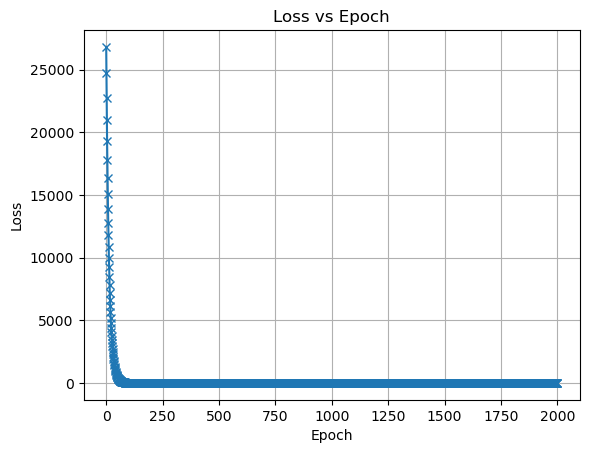

In [279]:
plt.plot(loss,marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid(True)
plt.show()


#### Use R2 score to evaluate LR equation output

In [280]:
r2_score(Y2,hx)

0.9889893174401476